In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


## Read Data

In [110]:
df=pd.read_csv("Loan approval prediction.csv")

In [112]:
df

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,58640,34,120000,MORTGAGE,5.0,EDUCATION,D,25000,15.95,0.21,Y,10,0
58641,58641,28,28800,RENT,0.0,MEDICAL,C,10000,12.73,0.35,N,8,1
58642,58642,23,44000,RENT,7.0,EDUCATION,D,6800,16.00,0.15,N,2,1
58643,58643,22,30000,RENT,2.0,EDUCATION,A,5000,8.90,0.17,N,3,0


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [60]:
df.isnull().sum()

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

In [101]:
df.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


In [103]:
df.describe(include='object')

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
count,58645,58645,58645,58645
unique,4,6,7,2
top,RENT,EDUCATION,A,N
freq,30594,12271,20984,49943


In [21]:
df.columns

Index(['id', 'person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status'],
      dtype='object')

In [114]:
df.drop(['id'],axis=1,inplace=True)

In [116]:
df.head(5)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


## EDA

Missing Values:
Series([], dtype: int64)

Summary Statistics:
                 id    person_age  person_income  person_emp_length  \
count  58645.000000  58645.000000   5.864500e+04       58645.000000   
mean   29322.000000     27.550857   6.404617e+04           4.701015   
std    16929.497605      6.033216   3.793111e+04           3.959784   
min        0.000000     20.000000   4.200000e+03           0.000000   
25%    14661.000000     23.000000   4.200000e+04           2.000000   
50%    29322.000000     26.000000   5.800000e+04           4.000000   
75%    43983.000000     30.000000   7.560000e+04           7.000000   
max    58644.000000    123.000000   1.900000e+06         123.000000   

          loan_amnt  loan_int_rate  loan_percent_income  \
count  58645.000000   58645.000000         58645.000000   
mean    9217.556518      10.677874             0.159238   
std     5563.807384       3.034697             0.091692   
min      500.000000       5.420000             0.000000   
25%

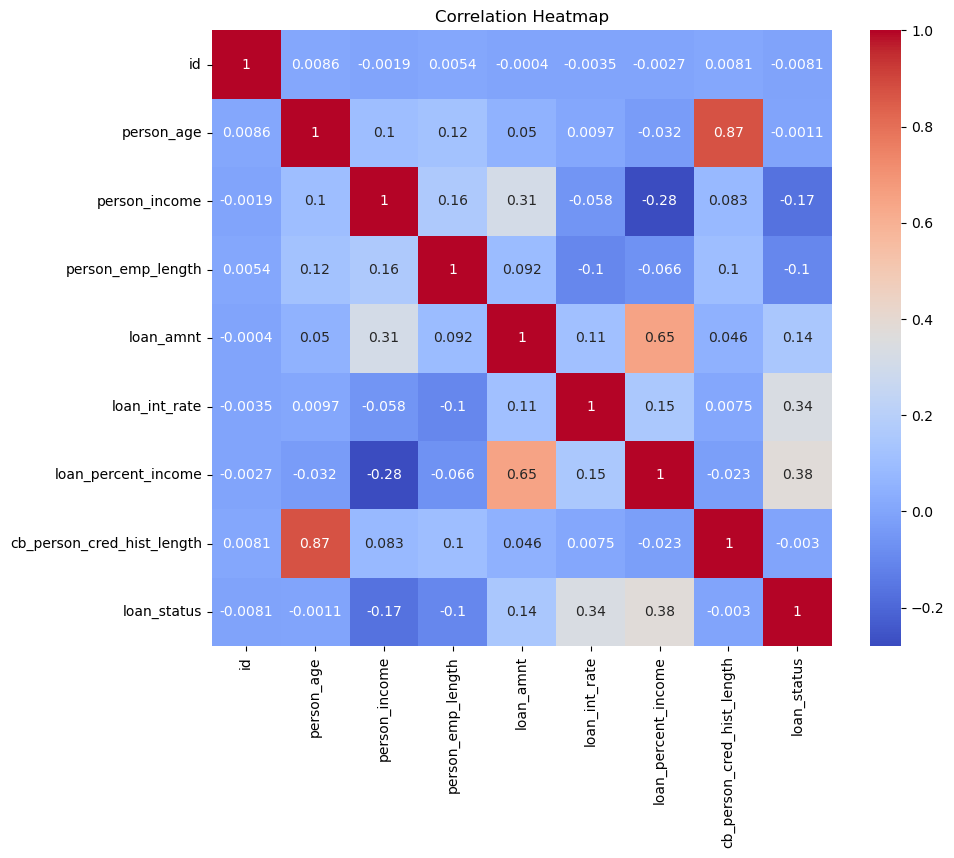

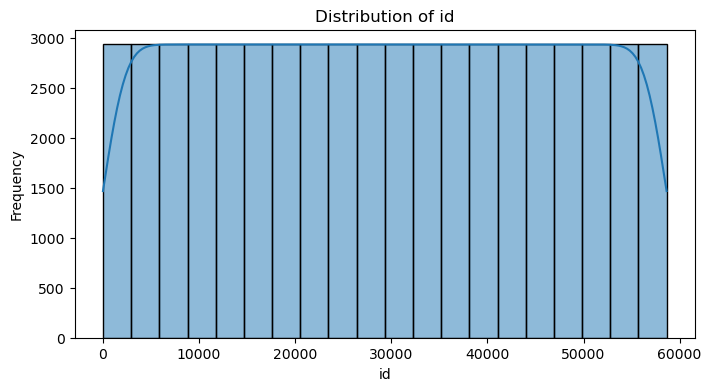

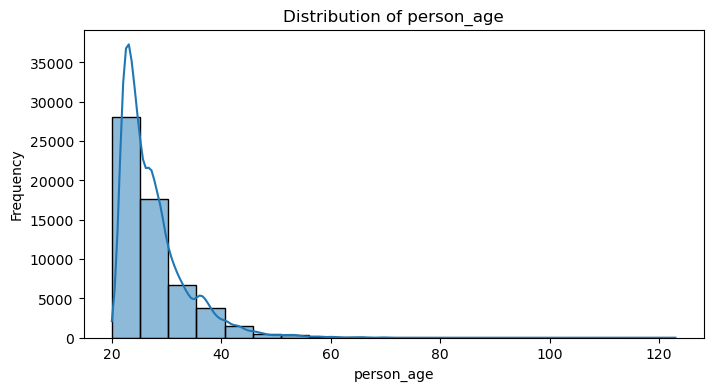

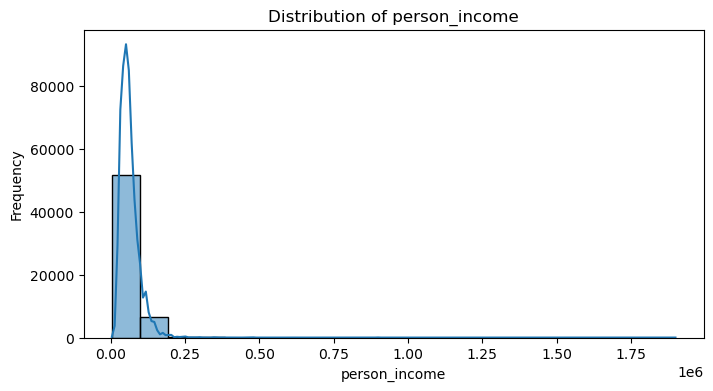

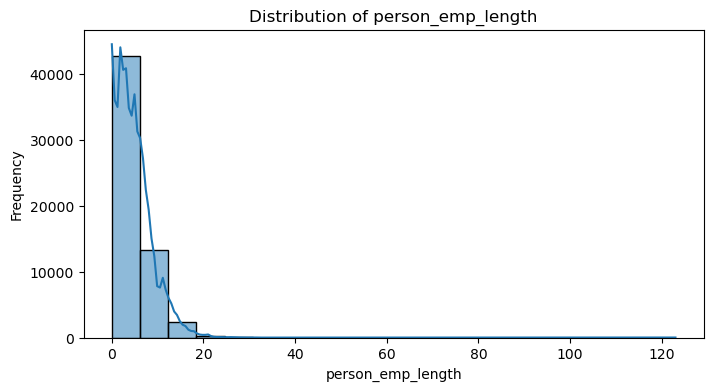

...

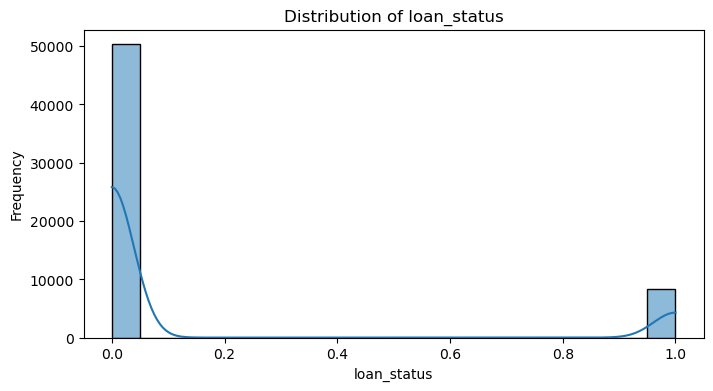

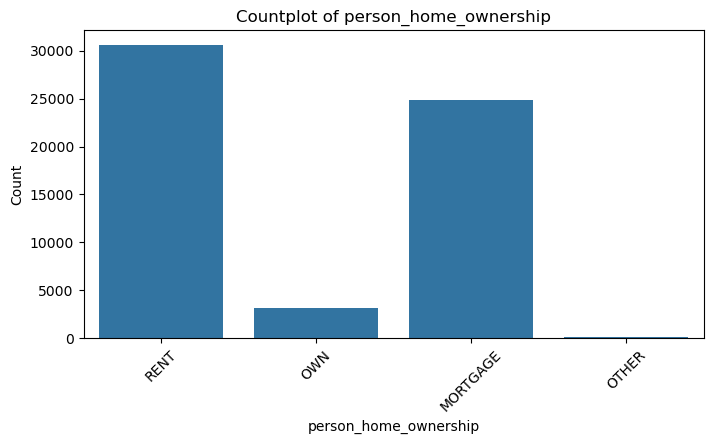

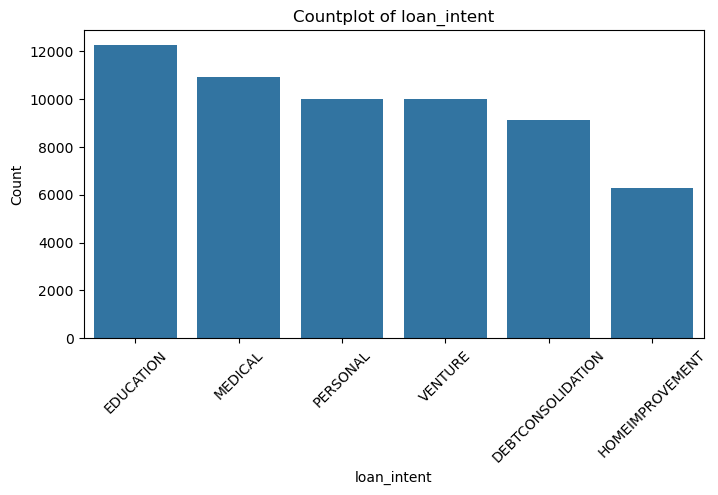

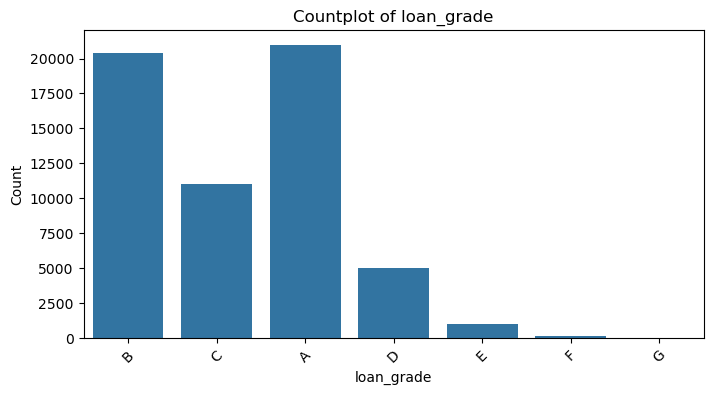

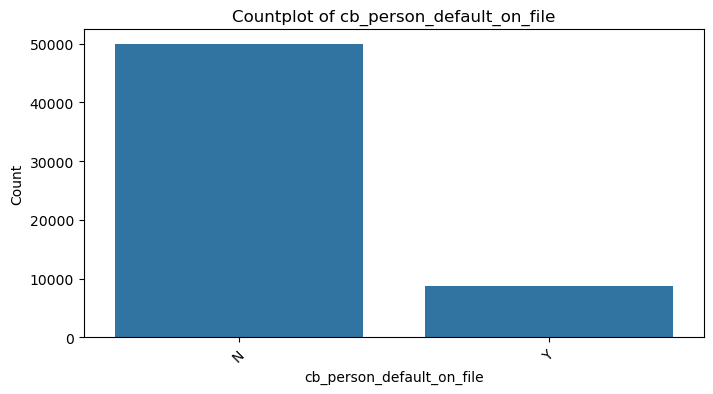

In [109]:
def perform_eda(df):
    # Check for missing values
    missing_values = df.isnull().sum()
    print("Missing Values:")
    print(missing_values[missing_values > 0])  # Display columns with missing values

    # Summary statistics
    summary_stats = df.describe()
    print("\nSummary Statistics:")
    print(summary_stats)

    # Correlation heatmap for numeric columns
    numeric_df = df.select_dtypes(include=['number'])
    plt.figure(figsize=(10, 8))
    sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
    plt.title("Correlation Heatmap")
    plt.show()

    # Distribution of numeric columns
    for column in numeric_df.columns:
        plt.figure(figsize=(8, 4))
        sns.histplot(df[column], bins=20, kde=True)
        plt.title(f"Distribution of {column}")
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.show()

    # Countplot for categorical columns
    categorical_df = df.select_dtypes(exclude=['number'])
    for column in categorical_df.columns:
        plt.figure(figsize=(8, 4))
        sns.countplot(data=df, x=column)
        plt.title(f"Countplot of {column}")
        plt.xlabel(column)
        plt.ylabel("Count")
        plt.xticks(rotation=45)
        plt.show()

perform_eda(df)

<Axes: xlabel='person_home_ownership'>

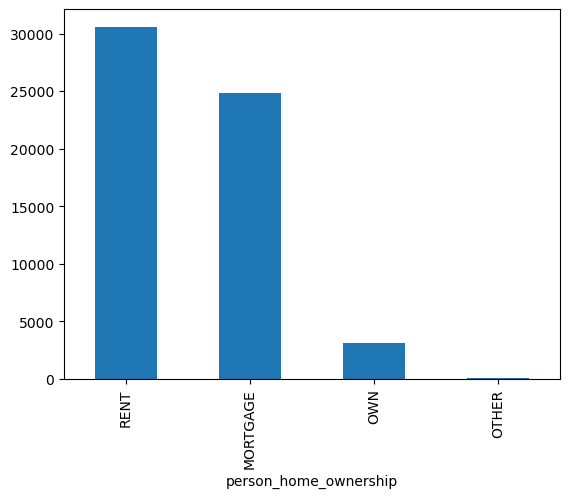

In [35]:
df['person_home_ownership'].value_counts().plot.bar()

Text(0.5, 1.0, 'Loan Status Distribution')

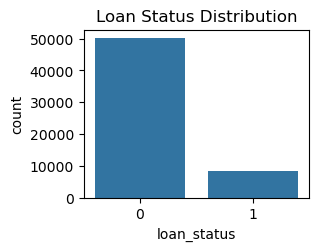

In [50]:
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='loan_status')
plt.title('Loan Status Distribution')

Text(0.5, 1.0, 'Interest Rate by Loan Grade')

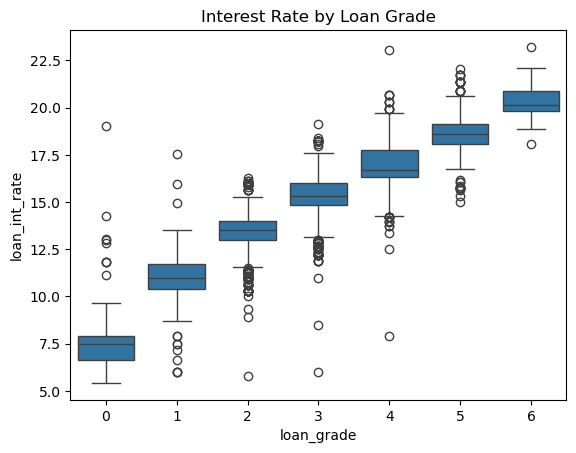

In [56]:
plt.subplot(1, 1, 1)
sns.boxplot(data=df, x='loan_grade', y='loan_int_rate')
plt.title('Interest Rate by Loan Grade')


Text(0.5, 1.0, 'Home Ownership Distribution')

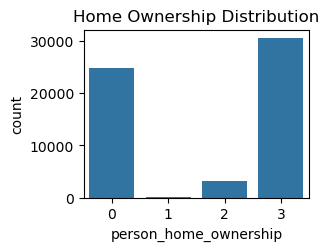

In [58]:
plt.subplot(2, 2, 3)
sns.countplot(data=df, x='person_home_ownership')
plt.title('Home Ownership Distribution')

Text(0.5, 1.0, 'Loan Amount by Intent')

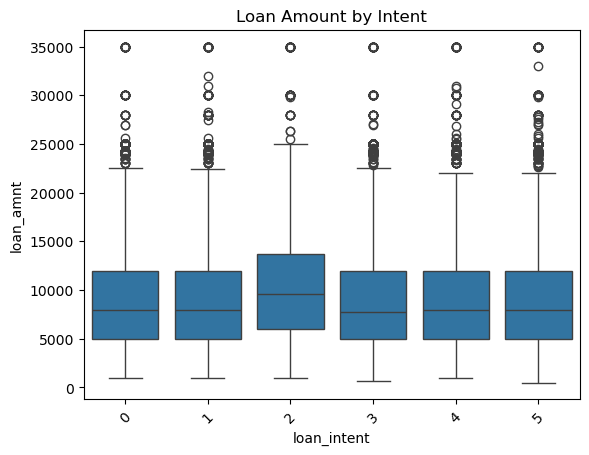

In [62]:
plt.subplot(1,1, 1)
sns.boxplot(data=df, x='loan_intent', y='loan_amnt')
plt.xticks(rotation=45)
plt.title('Loan Amount by Intent')

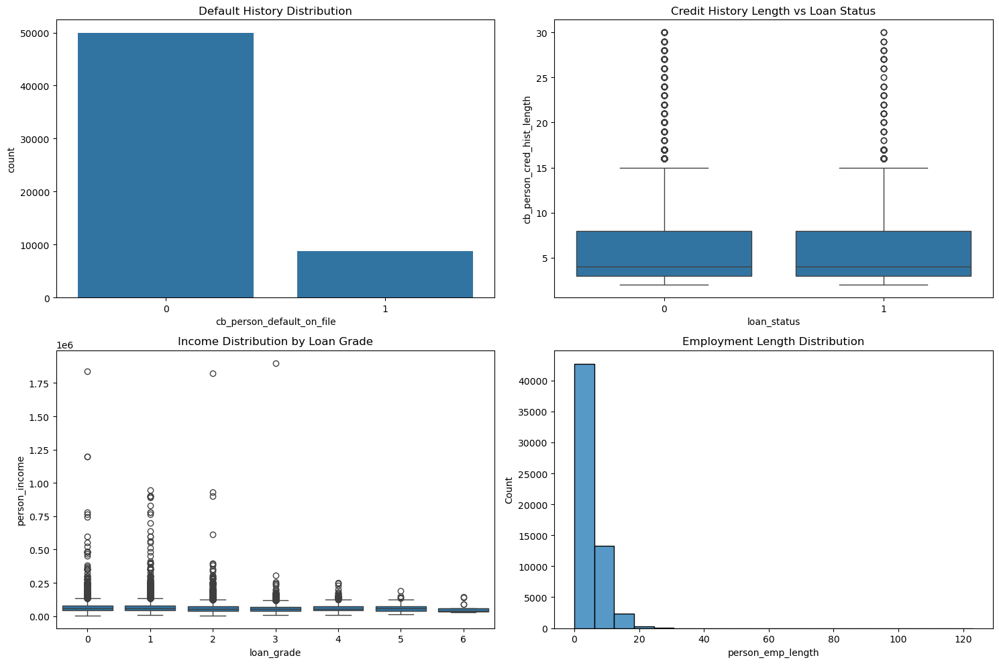

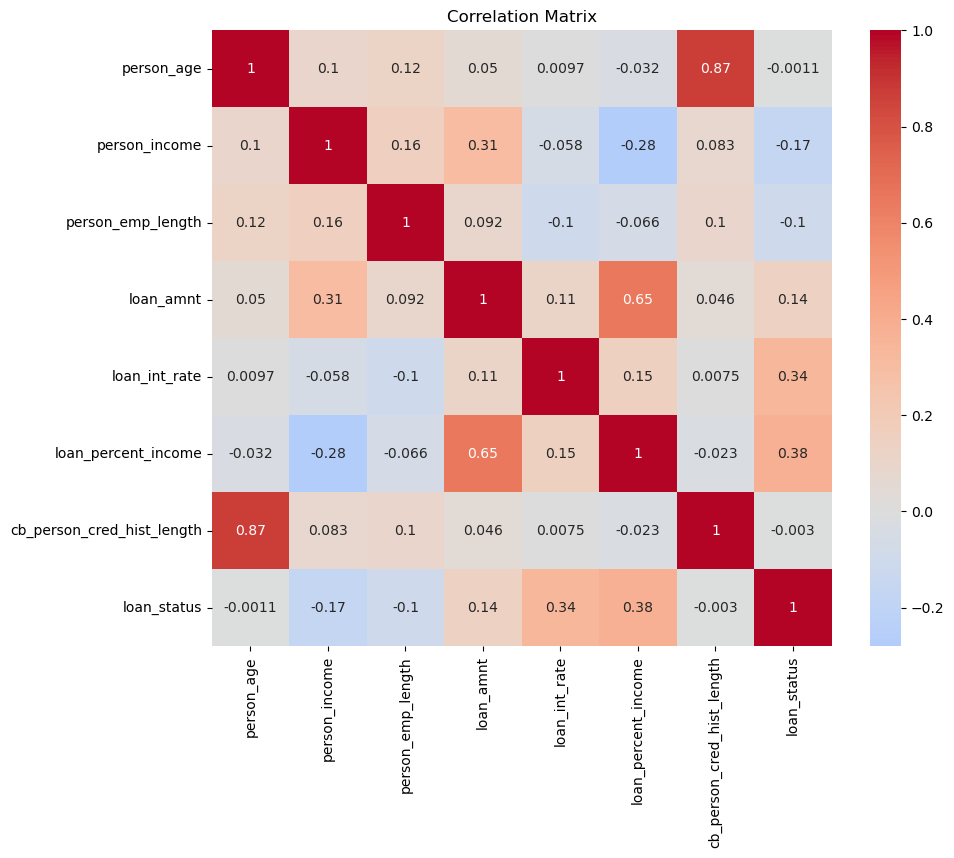

Loan Approval Rate: 85.76178702361668 %
Average Interest Rate: 10.67787449910478 %
Median Loan Amount: $ 8000.0


In [66]:
# Additional insights
plt.figure(figsize=(15, 10))

# Plot 1: Default History Distribution
plt.subplot(2, 2, 1)
sns.countplot(data=df, x='cb_person_default_on_file')
plt.title('Default History Distribution')

# Plot 2: Credit History Length vs Loan Status
plt.subplot(2, 2, 2)
sns.boxplot(data=df, x='loan_status', y='cb_person_cred_hist_length')
plt.title('Credit History Length vs Loan Status')

# Plot 3: Average Income by Loan Grade
plt.subplot(2, 2, 3)
sns.boxplot(data=df, x='loan_grade', y='person_income')
plt.title('Income Distribution by Loan Grade')

# Plot 4: Employment Length Distribution
plt.subplot(2, 2, 4)
sns.histplot(data=df, x='person_emp_length', bins=20)
plt.title('Employment Length Distribution')

plt.tight_layout()
plt.show()

# Calculate correlation between numerical variables
correlation_matrix = df.select_dtypes(include=['float64', 'int64']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()

# Print some key statistics
print("\
Loan Approval Rate:", (1 - df['loan_status'].mean()) * 100, "%")
print("Average Interest Rate:", df['loan_int_rate'].mean(), "%")
print("Median Loan Amount: $", df['loan_amnt'].median())

In [85]:
df.groupby('loan_grade')['loan_amnt'].count().reset_index(name='count').sort_values(by='count', ascending=False)

,loan_grade,count
0,0,20984
1,1,20400
2,2,11036
3,3,5034
4,4,1009
5,5,149
6,6,33


## Data Pre processing

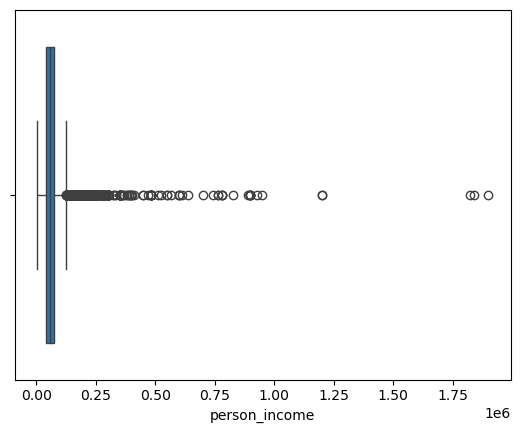

In [117]:
sns.boxplot(data=df,x='person_income')
plt.show()

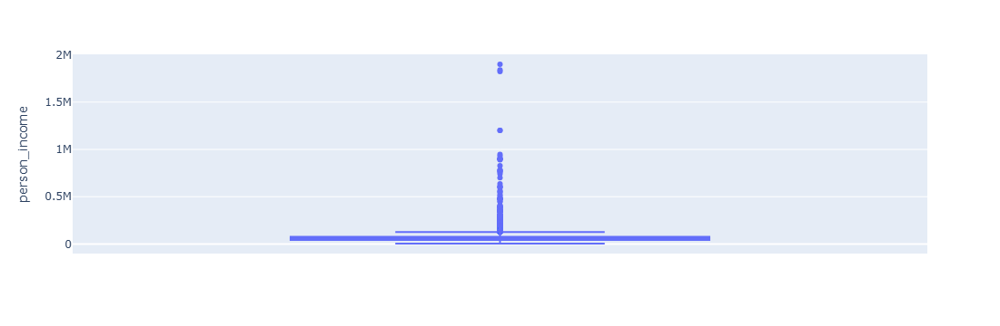

In [214]:
fig = px.box(df, y='person_income')
fig.show()

In [216]:
q1 = df['person_income'].quantile(0.25)
q3 = df['person_income'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
df = df[(df['person_income'] >= lower_bound) & (df['person_income'] <= upper_bound)]

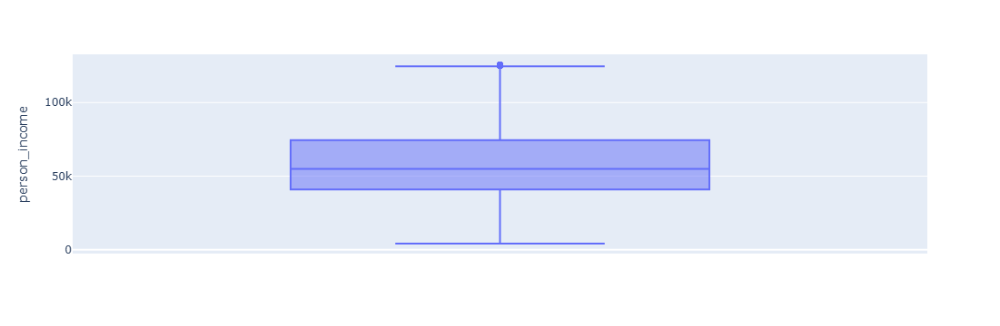

In [218]:
fig = px.box(df, y='person_income')
fig.show()

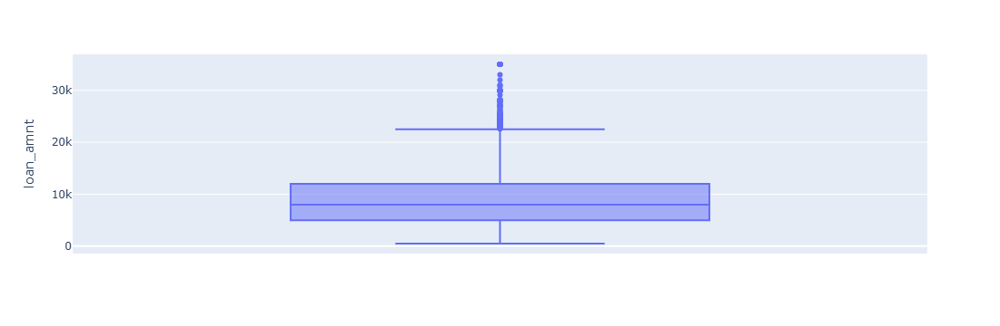

In [123]:
fig = px.box(df, y='loan_amnt')
fig.show()

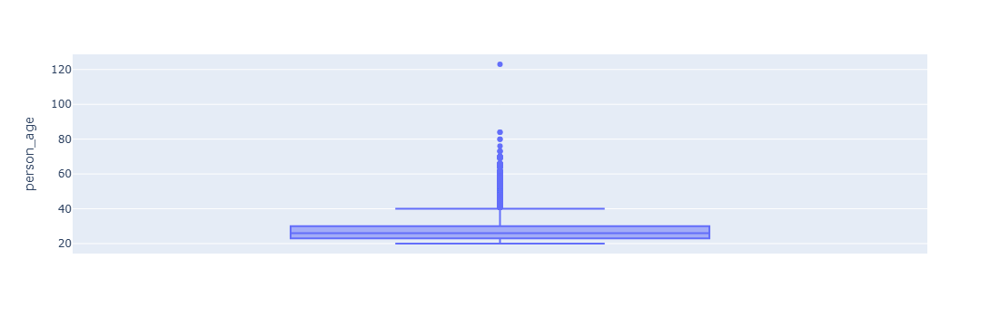

In [125]:
fig = px.box(df, y='person_age')
fig.show()

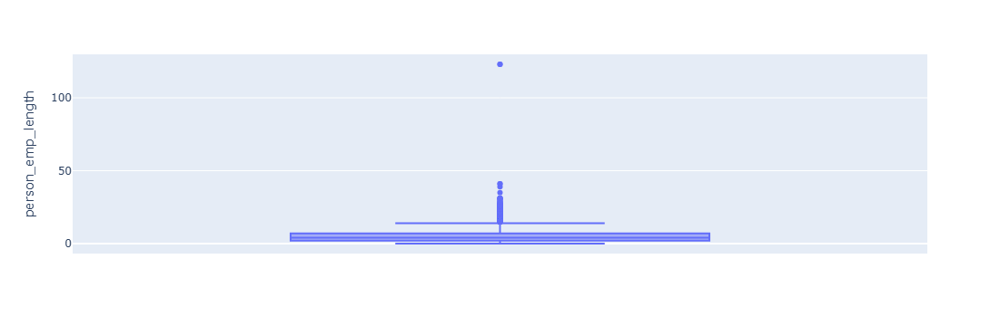

In [127]:
fig = px.box(df, y='person_emp_length')
fig.show()

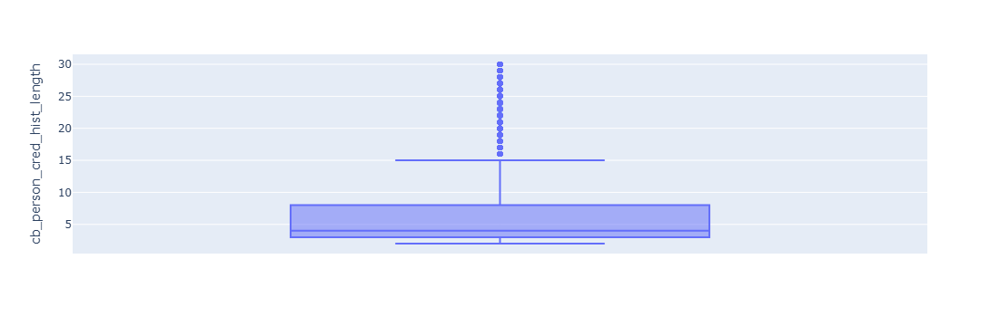

In [131]:
fig = px.box(df, y='cb_person_cred_hist_length')
fig.show()

In [11]:
df['loan_status'].value_counts()

loan_status
0    50295
1     8350
Name: count, dtype: int64

## Pair Plots by Loan Status

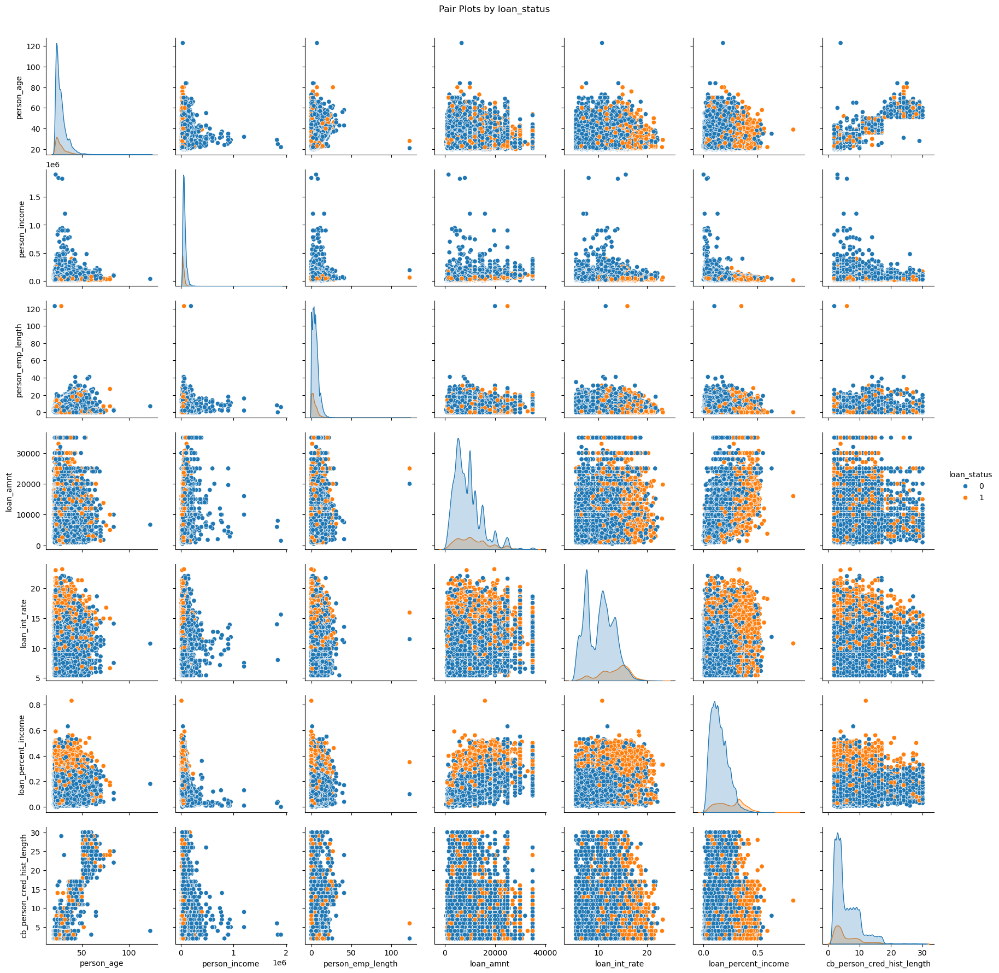

In [139]:
sns.pairplot(df, hue='loan_status')
plt.suptitle('Pair Plots by loan_status', y=1.02)
plt.show()
     

In [15]:
df['person_home_ownership'].value_counts()

person_home_ownership
RENT        30594
MORTGAGE    24824
OWN          3138
OTHER          89
Name: count, dtype: int64

In [17]:
df['loan_intent'].value_counts()

loan_intent
EDUCATION            12271
MEDICAL              10934
PERSONAL             10016
VENTURE              10011
DEBTCONSOLIDATION     9133
HOMEIMPROVEMENT       6280
Name: count, dtype: int64

In [19]:
df['loan_grade'].value_counts()

loan_grade
A    20984
B    20400
C    11036
D     5034
E     1009
F      149
G       33
Name: count, dtype: int64

In [22]:
df['cb_person_default_on_file'].value_counts()

cb_person_default_on_file
N    49943
Y     8702
Name: count, dtype: int64

In [118]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_categorical = df.select_dtypes(exclude=[np.number])
categorical_column_names = df_categorical.columns.to_list()
df[categorical_column_names] = df[categorical_column_names].apply(LabelEncoder().fit_transform)

In [120]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,3,0.0,1,1,6000,11.49,0.17,0,14,0
1,22,56000,2,6.0,3,2,4000,13.35,0.07,0,2,0
2,29,28800,2,8.0,4,0,6000,8.90,0.21,0,10,0
3,30,70000,3,14.0,5,1,12000,11.11,0.17,0,5,0
4,22,60000,3,2.0,3,0,6000,6.92,0.10,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,0,5.0,1,3,25000,15.95,0.21,1,10,0
58641,28,28800,3,0.0,3,2,10000,12.73,0.35,0,8,1
58642,23,44000,3,7.0,1,3,6800,16.00,0.15,0,2,1
58643,22,30000,3,2.0,1,0,5000,8.90,0.17,0,3,0


In [28]:
df['person_home_ownership'].value_counts()

person_home_ownership
3    30594
0    24824
2     3138
1       89
Name: count, dtype: int64

In [30]:
df['loan_intent'].value_counts()

loan_intent
1    12271
3    10934
4    10016
5    10011
0     9133
2     6280
Name: count, dtype: int64

In [32]:
df['loan_grade'].value_counts()

loan_grade
0    20984
1    20400
2    11036
3     5034
4     1009
5      149
6       33
Name: count, dtype: int64

In [34]:
df['cb_person_default_on_file'].value_counts()

cb_person_default_on_file
0    49943
1     8702
Name: count, dtype: int64

## DATA SPLITTING AND Model Building and Evaluation

In [122]:
X = df.drop('loan_status',axis=1).values
y = df['loan_status'].values

In [124]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(X)


In [126]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=0)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [128]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size = 0.2, random_state = 0)

In [27]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
classification_report_rf = classification_report(y_test, y_pred_rf)
confusion_matrix_rf = confusion_matrix(y_test, y_pred_rf)
print("\nRandom Forest Classifier:")
print("Accuracy:", accuracy_rf)
print("Classification Report:\n", classification_report_rf)
print("Confusion Matrix:\n", confusion_matrix_rf)
print("\n")




Random Forest Classifier:
Accuracy: 0.9679391589621235
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     10095
           1       0.98      0.95      0.97     10023

    accuracy                           0.97     20118
   macro avg       0.97      0.97      0.97     20118
weighted avg       0.97      0.97      0.97     20118

Confusion Matrix:
 [[9944  151]
 [ 494 9529]]




In [29]:

from sklearn.svm import SVC
svc_model = SVC(random_state=42)
svc_model.fit(X_train, y_train)
y_pred_svc = svc_model.predict(X_test)
accuracy_svc = accuracy_score(y_test, y_pred_svc)
classification_report_svc = classification_report(y_test, y_pred_svc)
confusion_matrix_svc = confusion_matrix(y_test, y_pred_svc)
print("\nSVC:")
print("Accuracy: ", accuracy_svc)
print("\nClassification Report: ", classification_report_svc)
print("\nConfusion Matrix: \n", confusion_matrix_svc)



SVC:
Accuracy:  0.8604235013420817

Classification Report:                precision    recall  f1-score   support

           0       0.82      0.92      0.87     10095
           1       0.91      0.80      0.85     10023

    accuracy                           0.86     20118
   macro avg       0.87      0.86      0.86     20118
weighted avg       0.87      0.86      0.86     20118


Confusion Matrix: 
 [[9280  815]
 [1993 8030]]


In [32]:
from sklearn.linear_model import LogisticRegression
log_model = LogisticRegression()
log_model.fit(X_train, y_train)
y_pred_log = log_model.predict(X_test)
accuracy_log = accuracy_score(y_test, y_pred_log)
classification_report_log = classification_report(y_test, y_pred_log)
confusion_matrix_log = confusion_matrix(y_test, y_pred_log)
print("\nLogistic Regression:")
print("Accuracy:", accuracy_log)
print("Classification Report:\n", classification_report_log)
print("Confusion Matrix:\n", confusion_matrix_log)
print("\n")


Logistic Regression:
Accuracy: 0.8134009344865295
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.81      0.81     10095
           1       0.81      0.82      0.81     10023

    accuracy                           0.81     20118
   macro avg       0.81      0.81      0.81     20118
weighted avg       0.81      0.81      0.81     20118

Confusion Matrix:
 [[8147 1948]
 [1806 8217]]




In [34]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[8542 1553]
 [ 184 9839]]


0.9136594094840441

In [36]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[9339  756]
 [ 654 9369]]


0.9299135102892931

In [38]:
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
m = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[9339  756]
 [ 654 9369]]


0.8042548961129337

In [210]:
pip install xgboost


   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 330.3 kB/s eta 0:06:19
   ---------------------------------------- 0.0/124.9 MB 281.8 kB/s eta 0:07:24
   ---------------------------------------- 0.1/124.9 MB 328.2 kB/s eta 0:06:21
   ---------------------------------------- 0.1/124.9 MB 328.8 kB/s eta 0:06:20
   ---------------------------------------- 0.1/124.9 MB 502.3 kB/s eta 0:04:09
   ---------------------------------------- 0.2/124.9 MB 510.2 kB/s eta 0:04:05
   ---------------------------------------- 0.2/124.9 MB 567.2 kB/s eta 0:03:40
   ---------------------------------------- 0.3/124.9 MB 681.0 kB/s eta 0:03:04
   ---------------------------------------- 0.3/124.9 MB 723.4 kB/s eta 0:02:53
   ---------------------------------------- 0.4/124.9 MB 757.8 kB/

In [130]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
import xgboost as xgb
pipe = Pipeline([("scaler", MinMaxScaler()), ("xgb", xgb.XGBClassifier())])
pipe.fit(X_train, y_train)
pipe.score(X_test, y_test)


0.9704244954766875

In [132]:
import pickle

In [134]:
pickle.dump(pipe,open('pipe.pkl','wb'))

In [136]:
pipe = pickle.load(open('pipe.pkl','rb'))

In [102]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [104]:
import sys
print(sys.version)

3.12.4 | packaged by Anaconda, Inc. | (main, Jun 18 2024, 15:03:56) [MSC v.1929 64 bit (AMD64)]


In [138]:
pip install streamlit

Note: you may need to restart the kernel to use updated packages.


In [142]:
pip install --upgrade pip


   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
    --------------------------------------- 0.0/1.8 MB 217.9 kB/s eta 0:00:09
    --------------------------------------- 0.0/1.8 MB 195.7 kB/s eta 0:00:10
   - -------------------------------------- 0.1/1.8 MB 251.0 kB/s eta 0:00:08
   -- ------------------------------------- 0.1/1.8 MB 308.0 kB/s eta 0:00:06
   --- ------------------------------------ 0.1/1.8 MB 448.2 kB/s eta 0:00:04
   ---- ----------------------------------- 0.2/1.8 MB 540.4 kB/s eta 0:00:03
   ------ --------------------------------- 0.3/1.8 MB 680.9 kB/s eta 0:00:03
   ------ --------------------------------- 0.3/1.8 MB 680.9 kB/s eta 0:00:03
   -------- ------------------------------- 0.4/1.8 MB 757.8 kB/s eta 0:00:02
   ----------- -------